# Yolov8 Performance test on GPU and CPU
This notebook compares the performance of yolov8 on
1. Intel Core i7 CPU  i7-8550U 1.80GHz
2. Intel uhd 620 graphic gpu
3. Nvidia GPU Geforce MX150 4G

model_path is path of model weights

img_path is the path of test image

In [1]:
# include reuired packages
import openvino as ov
import ipywidgets as widgets
import numpy as np
from ultralytics import YOLO
from PIL import Image
import cv2
from typing import Tuple, Dict
import torch
import numpy as np
from ultralytics.utils.plotting import colors
from ultralytics.utils import ops
from time import time
import torchvision


## Yolo model and test image paths
replace this with your paths

In [7]:
main_path = 'F:/Camera/first_try/PerfomanceCheck/' #main path
model_path = 'F:/Camera/first_try/PerfomanceCheck/best.pt'#model path(save your model.pt as best.pt)
img_path = 'F:/Camera/first_try/PerfomanceCheck/new35.jpeg'#image path


## openvino
For maximum performance on Intel GPU and CPU we use openvino package

In [3]:
# detect available CPU and GPUs
core = ov.Core()
device = widgets.Dropdown(
    options=core.available_devices + ["AUTO"],
    value='AUTO',
    description='Device:',
    disabled=False,
)
print(device)

print("Nvidia GPU is availabel = ", torch.cuda.is_available())
torch.cuda.set_device(0) 

Dropdown(description='Device:', index=3, options=('CPU', 'GPU.0', 'GPU.1', 'AUTO'), value='AUTO')
Nvidia GPU is availabel =  True


## Models Initialize
1. model Yolov8n model for CPU
2. det_compiled_model openvino model for Intel uhd 620 GPU
3. det_compiled_model_cpu openvino model for CPU
4. det_compiled_model_gpu openvino model for Nvidia GPU
5. model_gpu Yolov8n model for Nvidia GPU


In [4]:
model = YOLO(model_path, task = 'detect')# build Yolov8 model
# Export model for Intel processors using openvino
model.export(format='openvino', half = True)  # creates 'best_openvino_model/' half = true (16bit floating point(fp16) and half = False fp32)
det_ov_model = core.read_model(main_path + 'best_openvino_model/best.xml')

det_compiled_model = core.compile_model(det_ov_model, 'GPU.0')#create openvino model for Intel uhd gpu
det_compiled_model_cpu = core.compile_model(det_ov_model, 'CPU')#create openvino model for cpu
det_compiled_model_gpu = core.compile_model(det_ov_model, 'GPU.1')#create openvino model for Nvidia gpu

model.to(device = 'cpu')# create standard yolo model for cpu
model_gpu = YOLO(model_path, task = 'detect')
model_gpu.to(device = 'cuda')# create standard model for Nvidia GPU


Ultralytics YOLOv8.0.226 🚀 Python-3.11.4 torch-2.0.1+cu117 CPU (Intel Core(TM) i7-8550U 1.80GHz)
Model summary (fused): 168 layers, 3007793 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from 'F:\Camera\first_try\PerfomanceCheck\best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 15, 8400) (6.0 MB)

ONNX: starting export with onnx 1.15.0 opset 17...
============= Diagnostic Run torch.onnx.export version 2.0.1+cu117 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================

ONNX: export success ✅ 1.2s, saved as 'F:\Camera\first_try\PerfomanceCheck\best.onnx' (11.7 MB)

OpenVINO: starting export with openvino 2023.2.0-13089-cfd42bd2cb0-HEAD...
OpenVINO: export success ✅ 2.2s, saved as 'F:\Camera\first_try\PerfomanceCheck\best_openvino_model\' (6.1 MB)

Export complete (6.4s)
Results saved to F:\Camera\first_try\PerfomanceCheck
Predict:         yolo predict task=detect model=F:\Camera\f

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_s

## Some funtions to work with openvino model
For more details refer to this notebokk: https://github.com/openvinotoolkit/openvino_notebooks/blob/main/notebooks/230-yolov8-optimization/230-yolov8-object-detection.ipynb

In [21]:


def letterbox(img: np.ndarray, new_shape:Tuple[int, int] = (640, 640), color:Tuple[int, int, int] = (114, 114, 114), auto:bool = False, scale_fill:bool = False, scaleup:bool = False, stride:int = 32):
    """
    Resize image and padding for detection. Takes image as input, 
    resizes image to fit into new shape with saving original aspect ratio and pads it to meet stride-multiple constraints
    
    Parameters:
      img (np.ndarray): image for preprocessing
      new_shape (Tuple(int, int)): image size after preprocessing in format [height, width]
      color (Tuple(int, int, int)): color for filling padded area
      auto (bool): use dynamic input size, only padding for stride constrins applied
      scale_fill (bool): scale image to fill new_shape
      scaleup (bool): allow scale image if it is lower then desired input size, can affect model accuracy
      stride (int): input padding stride
    Returns:
      img (np.ndarray): image after preprocessing
      ratio (Tuple(float, float)): hight and width scaling ratio
      padding_size (Tuple(int, int)): height and width padding size
    
    
    """
    # Resize and pad image while meeting stride-multiple constraints
    shape = img.shape[:2]  # current shape [height, width]
    if isinstance(new_shape, int):
        new_shape = (new_shape, new_shape)

    # Scale ratio (new / old)
    r = min(new_shape[0] / shape[0], new_shape[1] / shape[1])
    if not scaleup:  # only scale down, do not scale up (for better test mAP)
        r = min(r, 1.0)

    # Compute padding
    ratio = r, r  # width, height ratios
    new_unpad = int(round(shape[1] * r)), int(round(shape[0] * r))
    dw, dh = new_shape[1] - new_unpad[0], new_shape[0] - new_unpad[1]  # wh padding
    if auto:  # minimum rectangle
        dw, dh = np.mod(dw, stride), np.mod(dh, stride)  # wh padding
    elif scale_fill:  # stretch
        dw, dh = 0.0, 0.0
        new_unpad = (new_shape[1], new_shape[0])
        ratio = new_shape[1] / shape[1], new_shape[0] / shape[0]  # width, height ratios

    dw /= 2  # divide padding into 2 sides
    dh /= 2

    if shape[::-1] != new_unpad:  # resize
        img = cv2.resize(img, new_unpad, interpolation=cv2.INTER_LINEAR)
    top, bottom = int(round(dh - 0.1)), int(round(dh + 0.1))
    left, right = int(round(dw - 0.1)), int(round(dw + 0.1))
    img = cv2.copyMakeBorder(img, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)  # add border
    return img, ratio, (dw, dh)


def preprocess_image(img0: np.ndarray):
    """
    Preprocess image according to YOLOv8 input requirements. 
    Takes image in np.array format, resizes it to specific size using letterbox resize and changes data layout from HWC to CHW.
    
    Parameters:
      img0 (np.ndarray): image for preprocessing
    Returns:
      img (np.ndarray): image after preprocessing
    """
    # resize
    img = letterbox(img0)[0]
    
    # Convert HWC to CHW
    img = img.transpose(2, 0, 1)
    img = np.ascontiguousarray(img)
    return img


def image_to_tensor(image:np.ndarray):
    """
    Preprocess image according to YOLOv8 input requirements. 
    Takes image in np.array format, resizes it to specific size using letterbox resize and changes data layout from HWC to CHW.
    
    Parameters:
      img (np.ndarray): image for preprocessing
    Returns:
      input_tensor (np.ndarray): input tensor in NCHW format with float32 values in [0, 1] range 
    """
    input_tensor = image.astype(np.float16)  # uint8 to fp32
    input_tensor /= 255.0  # 0 - 255 to 0.0 - 1.0
    
    # add batch dimension
    if input_tensor.ndim == 3:
        input_tensor = np.expand_dims(input_tensor, 0)
    return input_tensor

def postprocess(
    pred_boxes:np.ndarray, 
    input_hw:Tuple[int, int], 
    orig_img:np.ndarray, 
    min_conf_threshold:float = 0.25, 
    nms_iou_threshold:float = 0.7, 
    agnosting_nms:bool = False, 
    max_detections:int = 300,
):
    """
    YOLOv8 model postprocessing function. Applied non maximum supression algorithm to detections and rescale boxes to original image size
    Parameters:
        pred_boxes (np.ndarray): model output prediction boxes
        input_hw (np.ndarray): preprocessed image
        orig_image (np.ndarray): image before preprocessing
        min_conf_threshold (float, *optional*, 0.25): minimal accepted confidence for object filtering
        nms_iou_threshold (float, *optional*, 0.45): minimal overlap score for removing objects duplicates in NMS
        agnostic_nms (bool, *optiona*, False): apply class agnostinc NMS approach or not
        max_detections (int, *optional*, 300):  maximum detections after NMS
    Returns:
       pred (List[Dict[str, np.ndarray]]): list of dictionary with det - detected boxes in format [x1, y1, x2, y2, score, label]
    """
    nms_kwargs = {"agnostic": agnosting_nms, "max_det":max_detections}
    preds = ops.non_max_suppression(
        torch.from_numpy(pred_boxes),
        min_conf_threshold,
        nms_iou_threshold,
        nc=11,
        **nms_kwargs
    )

    results = []
    for i, pred in enumerate(preds):
        shape = orig_img[i].shape if isinstance(orig_img, list) else orig_img.shape
        if not len(pred):
            results.append({"det": [], "segment": []})
            continue
        pred[:, :4] = ops.scale_boxes(input_hw, pred[:, :4], shape).round()
        results.append({"det": pred})

    return results

def plot_one_box(box:np.ndarray, img:np.ndarray,
                 color:Tuple[int, int, int] = None,
                 label:str = None, line_thickness:int = 5):
    """
    Helper function for drawing single bounding box on image
    Parameters:
        x (np.ndarray): bounding box coordinates in format [x1, y1, x2, y2]
        img (no.ndarray): input image
        color (Tuple[int, int, int], *optional*, None): color in BGR format for drawing box, if not specified will be selected randomly
        label (str, *optonal*, None): box label string, if not provided will not be provided as drowing result
        line_thickness (int, *optional*, 5): thickness for box drawing lines
    """
    # Plots one bounding box on image img
    tl = line_thickness or round(0.002 * (img.shape[0] + img.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(box[0]), int(box[1])), (int(box[2]), int(box[3]))
    cv2.rectangle(img, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(label, 0, fontScale=tl / 3, thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(img, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(img, label, (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)

    return img

def draw_results(results:Dict, source_image:np.ndarray, label_map:Dict):
    """
    Helper function for drawing bounding boxes on image
    Parameters:
        image_res (np.ndarray): detection predictions in format [x1, y1, x2, y2, score, label_id]
        source_image (np.ndarray): input image for drawing
        label_map; (Dict[int, str]): label_id to class name mapping
    Returns:
        Image with boxes
    """
    boxes = results["det"]
    for idx, (*xyxy, conf, lbl) in enumerate(boxes):
        label = f'{label_map[int(lbl)]} {conf:.2f}'
        source_image = plot_one_box(xyxy, source_image, label=label, color=colors(int(lbl)), line_thickness=5)
    return source_image

def detect(image:np.ndarray, model:ov.Model):
    """
    OpenVINO YOLOv8 model inference function. Preprocess image, runs model inference and postprocess results using NMS.
    Parameters:
        image (np.ndarray): input image.
        model (Model): OpenVINO compiled model.
    Returns:
        detections (np.ndarray): detected boxes in format [x1, y1, x2, y2, score, label]
    """
    preprocessed_image = preprocess_image(image)
    input_tensor = image_to_tensor(preprocessed_image)
    result = model(input_tensor)
    boxes = result[model.output(0)]
    input_hw = input_tensor.shape[2:]
    detections = postprocess(pred_boxes=boxes, input_hw=input_hw, orig_img=image)
    return detections


## Initialize labels, test image and iterations and models

In [36]:
label_map = model.model.names
input_image1 = np.array(Image.open(img_path))
iterations = 1000
print(label_map)
detections3 = model.predict(source=input_image1,conf=0.35,iou=0.75, verbose = False,imgsz = 640)
detections0 = detect(input_image1, det_compiled_model)[0]
detections1 = detect(input_image1, det_compiled_model_cpu)[0]
detections2 = detect(input_image1, det_compiled_model_gpu)[0]
detections4 = model_gpu.predict(source=input_image1,conf=0.35,iou=0.75, verbose = False,imgsz = 640)


{0: 'Pinhole', 1: 'defect2', 2: 'defect3', 3: 'defect4', 4: 'inclusion', 5: 'pitted_surface', 6: 'rolled-in_scale', 7: 'patches', 8: 'scratches', 9: 'crazing', 10: 'defects'}


1. model Yolov8n model for CPU

processing time =  219.81007289886475


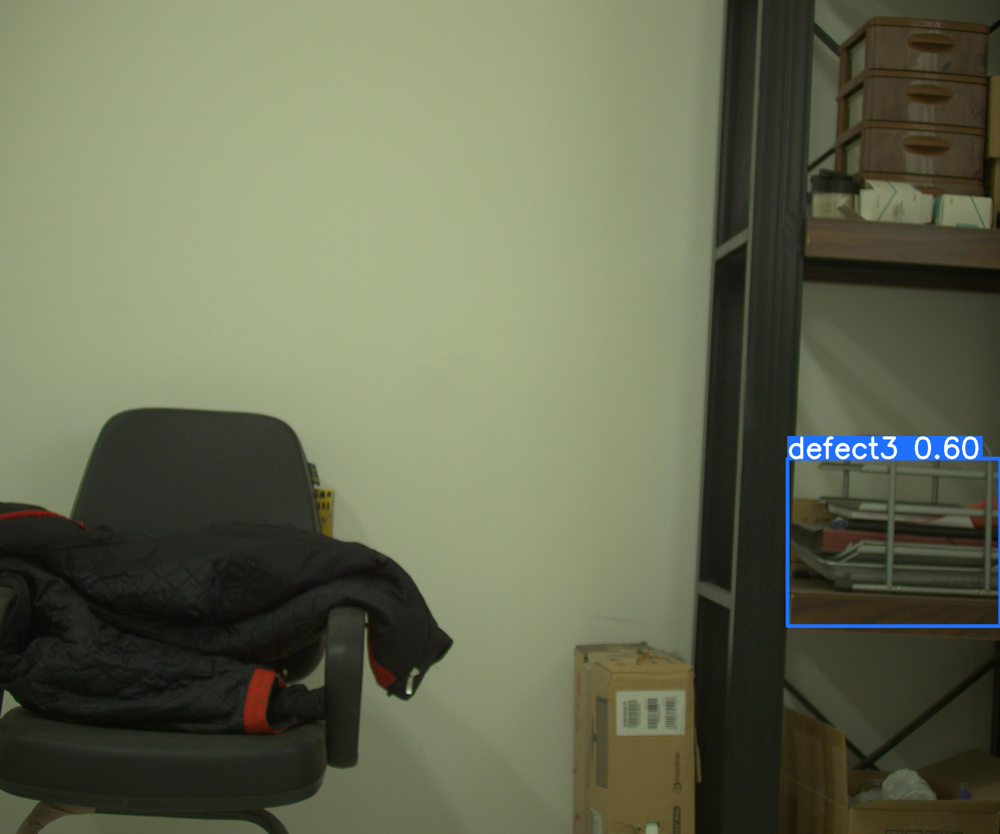

In [37]:
start = time()
for i in range(iterations):
    detections3 = model.predict(source=input_image1,conf=0.35,iou=0.75, verbose = False,imgsz = 640)
end = time()
t1 = end - start
print('processing time = ', t1)
Image.fromarray(detections3[0].plot())


2. det_compiled_model openvino model for Intel uhd 620 GPU

processing time =  83.48633170127869


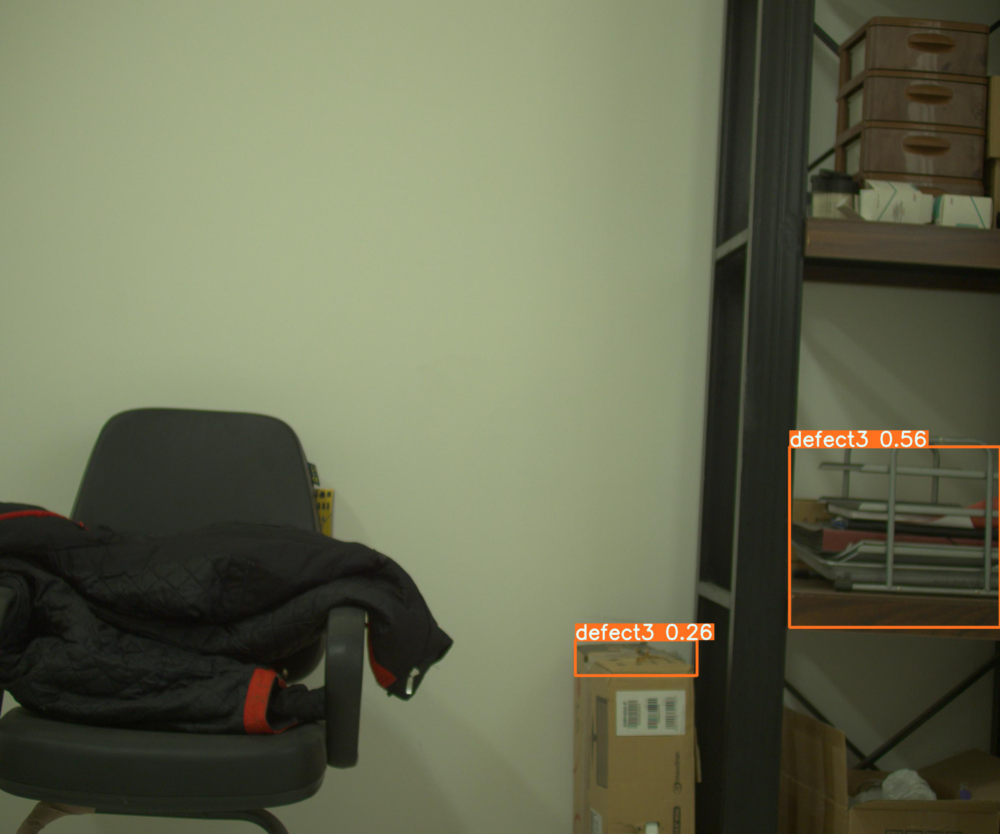

In [38]:
label_map = model.model.names
input_image1 = np.array(Image.open(img_path))
start = time()
for i in range(iterations):
    detections0 = detect(input_image1, det_compiled_model)[0]
end = time()
t2 = end - start
print('processing time = ', t2)
image_with_boxes = draw_results(detections0, input_image1, label_map)
Image.fromarray(image_with_boxes)


3. det_compiled_model_cpu openvino model for CPU


processing time =  141.16874814033508


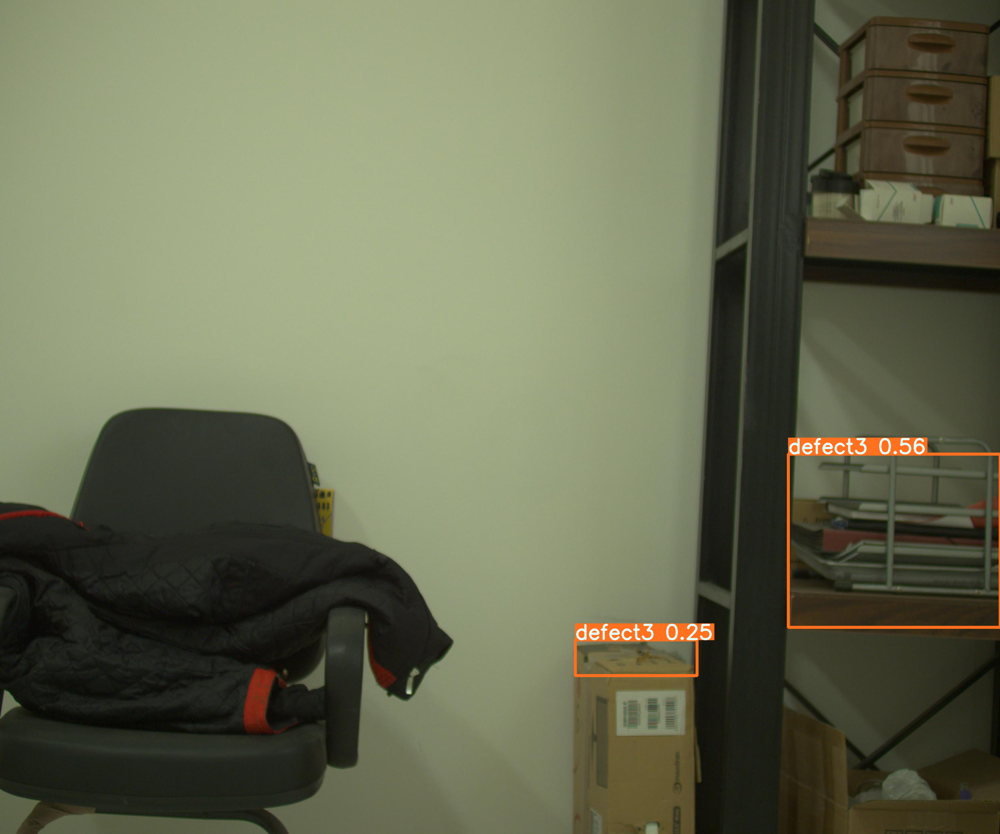

In [39]:
label_map = model.model.names
input_image1 = np.array(Image.open(img_path))
start = time()
for i in range(iterations):
    detections1 = detect(input_image1, det_compiled_model_cpu)[0]
end = time()
t3 = end - start
print('processing time = ', t3)
image_with_boxes = draw_results(detections1, input_image1, label_map)
Image.fromarray(image_with_boxes)


4. det_compiled_model_gpu openvino model for Nvidia GPU

processing time =  426.0522348880768


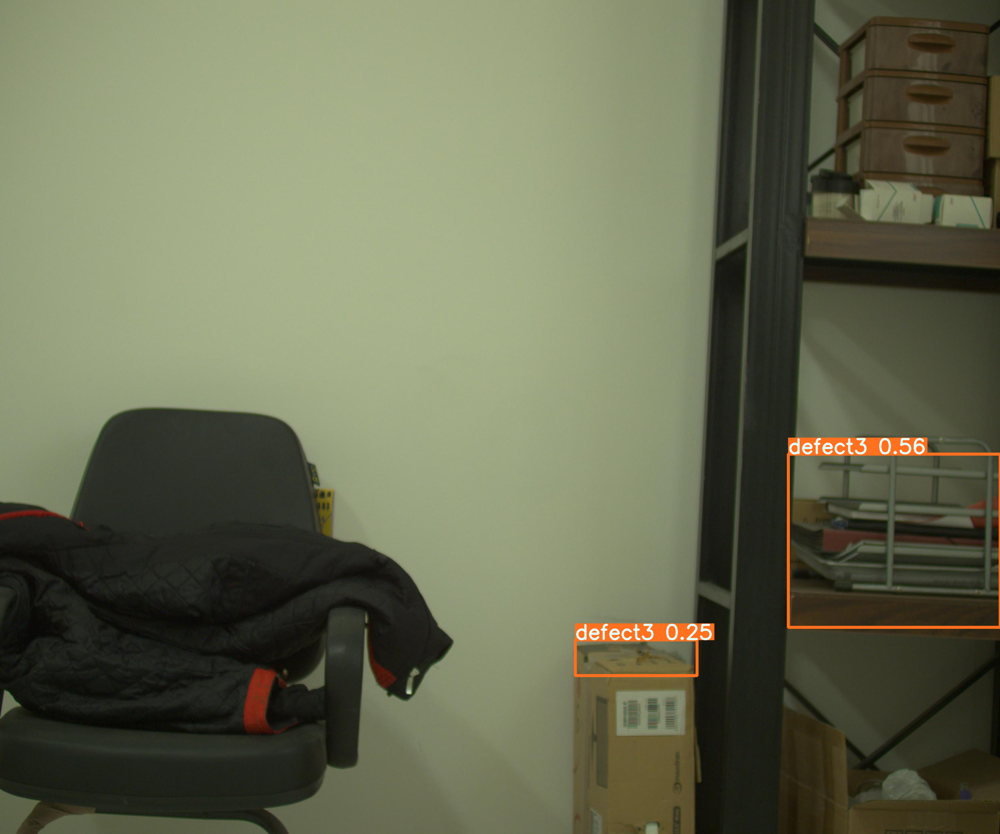

In [40]:
label_map = model.model.names
input_image1 = np.array(Image.open(img_path))
start = time()
for i in range(iterations):
    detections2 = detect(input_image1, det_compiled_model_gpu)[0]
end = time()
t4 = end - start
print('processing time = ', t4)
image_with_boxes = draw_results(detections2, input_image1, label_map)
Image.fromarray(image_with_boxes)


5. model_gpu Yolov8n model for Nvidia GPU

processing time =  38.992755651474


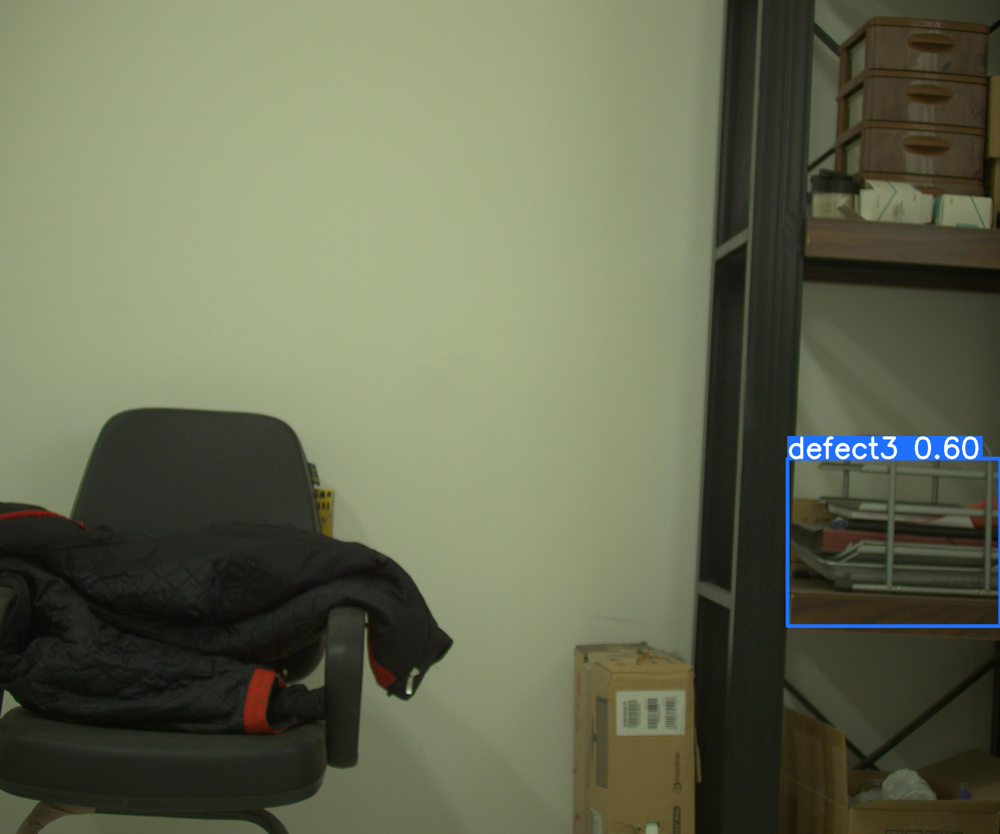

In [41]:
label_map = model.model.names
input_image1 = np.array(Image.open(img_path))
start = time()
for i in range(iterations):
    detections4 = model_gpu.predict(source=input_image1,conf=0.35,iou=0.75, verbose = False,imgsz = 640)
end = time()
t5 = end - start
print('processing time = ', t5)
Image.fromarray(detections4[0].plot())


## Summary

In [59]:
print('performance of Yolov8n model with CPU = ', format(iterations/t1, ".2f"),'FPS')
print('performance of openvino model with Intel uhd 620 GPU = ', format(iterations/t2, ".2f"),'FPS')
print('performance of openvino model with CPU = ', format(iterations/t3, ".2f"),'FPS')
print('performance of openvino model with Nvidia GPU = ', format(iterations/t4, ".2f"),'FPS')
print('performance of Yolov8n model with Nvidia GPU = ', format(iterations/t5, ".2f"),'FPS')



performance of Yolov8n model with CPU =  4.55 FPS
performance of openvino model with Intel uhd 620 GPU =  11.98 FPS
performance of openvino model with CPU =  7.08 FPS
performance of openvino model with Nvidia GPU =  2.35 FPS
performance of Yolov8n model with Nvidia GPU =  25.65 FPS
